# Compare ref test run at CDP compared to setting SCF 0 to 1 (ZSNLROT = 0.01)

I set the minimum snow depth (`ZSNLROT` or `SNOLIM`) to 1 mm in `src/dynamicTiling.f90` and `src/modelStateDrivers.f90` in order to "mimic" the fact to quickly reach 100% snow cover fraction compared to the reference run with a minimum snow depth of 10 cm. 

Note: setting directly 1 or 0 SCF (`FSNOW`) in `src/radiationDriver.f90` raise error in `src/energyWaterBalanceCheck.f90` because of non conservation of the water budget when directly .

<mark>/!\ This still does not work if setting minimum snow depth lower than 1 cm -> problem of water budget /!\

In [1]:
# Env: phd_v3
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)
import calendar
import os

In [198]:
path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/FR-Cdp_test/run'
path2 = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowMIP/FR-Cdp_test/run_SCF_1'

label = 'run'
ds_yr = xr.open_mfdataset(path+'/*_annually.nc')
ds_mo = xr.open_mfdataset(path+'/*_monthly.nc')
ds_d = xr.open_mfdataset(path+'/*_daily.nc')
ds_hh = xr.open_mfdataset(path+'/*_halfhourly.nc')

label2 = 'run_SCF_1'
ds2_mo = xr.open_mfdataset(path2+'/*_monthly.nc')
ds2_d = xr.open_mfdataset(path2+'/*_daily.nc')
ds2_hh = xr.open_mfdataset(path2+'/*_halfhourly.nc')

Text(0.5, 0.98, 'Run Col de Porte (1995-2013)')

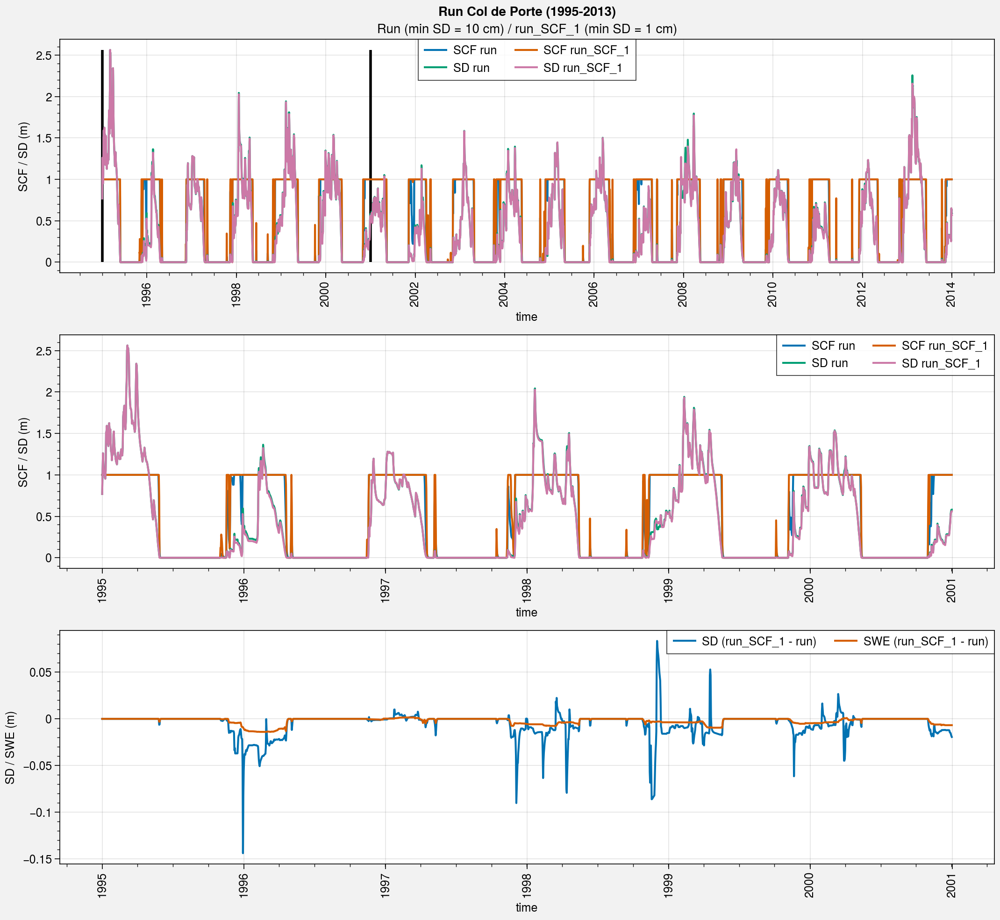

In [32]:
fig, axs = plot.subplots(ncols=1, nrows=3, aspect=4, axwidth=10, share=0)

##################
### All period ###
##################
start = '1995'
end = '2013'

axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
axs[0].plot(ds2_d.snc.sel(time=slice(start,end)), label='SCF '+label2)
axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)
axs[0].plot(ds2_d.snd.sel(time=slice(start,end)), label='SD '+label2)

axs[0].legend(ncols=2)
axs[0].format(
    title='Run (min SD = 10 cm) / run_SCF_1 (min SD = 1 cm)',
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = '1995'
end = '2000'

axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
axs[1].plot(ds2_d.snc.sel(time=slice(start,end)), label='SCF '+label2)
axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)
axs[1].plot(ds2_d.snd.sel(time=slice(start,end)), label='SD '+label2)
axs[0].vlines(ds_d.sel(time=slice(start,end)).time[0], ds_d.snd.min(), ds_d.snd.max(), color='k', lw=2)
axs[0].vlines(ds_d.sel(time=slice(start,end)).time[-1], ds_d.snd.min(), ds_d.snd.max(), color='k', lw=2)

axs[1].legend(ncols=2)
axs[1].format(
    ylabel='SCF / SD (m)'
)

#####################
### SWE / SD diff ###
#####################
axs[2].plot((ds2_d-ds_d).snd.sel(time=slice(start,end)), label='SD ('+label2+' - '+label+')')
axs[2].plot(((ds2_d-ds_d).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+label2+' - '+label+')')

axs[2].legend(ncols=2)
axs[2].format(
    ylabel='SD / SWE (m)'
)

fig.suptitle('Run Col de Porte (1995-2013)')


## Half hourly outputs

Zoom on the begining of the snow season

Text(0.5, 0.98, 'Col de Porte')

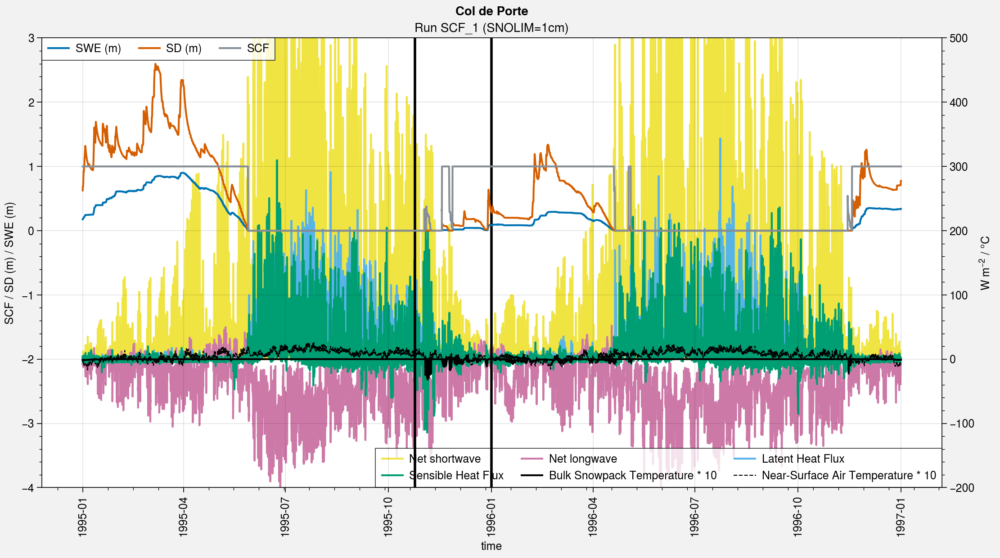

In [51]:
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

period = slice('1995','1996')

axs[0].plot(ds2_hh.snw.sel(time=period)*1e-3, label='SWE (m)')
axs[0].plot(ds2_hh.snd.sel(time=period), label='SD (m)')
axs[0].plot(ds2_hh.snc.sel(time=period), label='SCF', color='gray6')

ox = axs[0].alty(label='W m$^{-2}$ / °C')
ox.plot(ds2_hh.rss.sel(time=period), label='Net shortwave', color='C4')
ox.plot(ds2_hh.rls.sel(time=period), label='Net longwave', color='C3')
ox.plot(ds2_hh.hfls.sel(time=period), label='Latent Heat Flux', color='C5')
ox.plot(ds2_hh.hfss.sel(time=period), label='Sensible Heat Flux', color='C2')
ox.plot((ds2_hh.tsn.sel(time=period)), label='Bulk Snowpack Temperature * 10', color='k')
ox.plot((ds2_hh.tas.sel(time=period)-273.15), label='Near-Surface Air Temperature * 10', color='k', ls='--', lw=0.8)

ox.legend(loc='lr')
axs[0].legend(loc='ul')
axs[0].format(title='Run SCF_1 (SNOLIM=1cm)', ylabel='SCF / SD (m) / SWE (m)')
ox.format(ylim=(-200, 500))
axs[0].format(ylim=(-4, 3))

period2 = slice('1995-10-25','1996-01-01')
axs[0].vlines(ds_d.sel(time=period2).time[0], -4, 3, color='k', lw=2)
axs[0].vlines(ds_d.sel(time=period2).time[-1], -4, 3, color='k', lw=2)

fig.suptitle('Col de Porte')

Text(0.5, 0.98, 'Col de Porte')

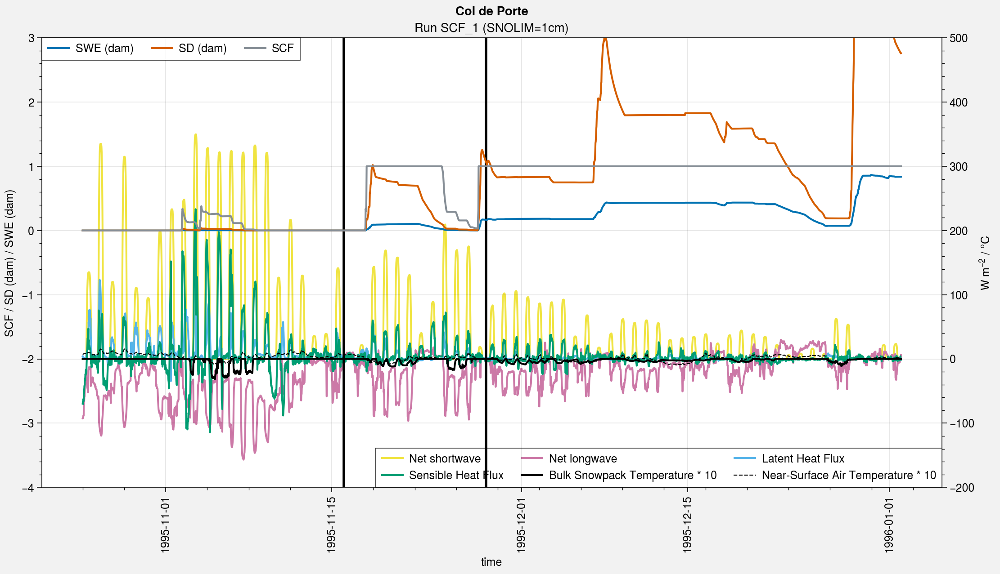

In [55]:
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

axs[0].plot(ds2_hh.snw.sel(time=period2)*1e-3*10, label='SWE (dam)')
axs[0].plot(ds2_hh.snd.sel(time=period2)*10, label='SD (dam)')
axs[0].plot(ds2_hh.snc.sel(time=period2), label='SCF', color='gray6')

ox = axs[0].alty(label='W m$^{-2}$ / °C')
ox.plot(ds2_hh.rss.sel(time=period2), label='Net shortwave', color='C4')
ox.plot(ds2_hh.rls.sel(time=period2), label='Net longwave', color='C3')
ox.plot(ds2_hh.hfls.sel(time=period2), label='Latent Heat Flux', color='C5')
ox.plot(ds2_hh.hfss.sel(time=period2), label='Sensible Heat Flux', color='C2')
ox.plot((ds2_hh.tsn.sel(time=period2)), label='Bulk Snowpack Temperature * 10', color='k')
ox.plot((ds2_hh.tas.sel(time=period2)-273.15), label='Near-Surface Air Temperature * 10', color='k', ls='--', lw=0.8)

ox.legend(loc='lr')
axs[0].legend(loc='ul')
axs[0].format(title='Run SCF_1 (SNOLIM=1cm)', ylabel='SCF / SD (dam) / SWE (dam)')
ox.format(ylim=(-200, 500))
axs[0].format(ylim=(-4, 3))

period3 = slice('1995-11-16','1995-11-28')
axs[0].vlines(ds_d.sel(time=period3).time[0], -4, 3, color='k', lw=2)
axs[0].vlines(ds_d.sel(time=period3).time[-1], -4, 3, color='k', lw=2)

fig.suptitle('Col de Porte')

Text(0.5, 0.98, 'Col de Porte')

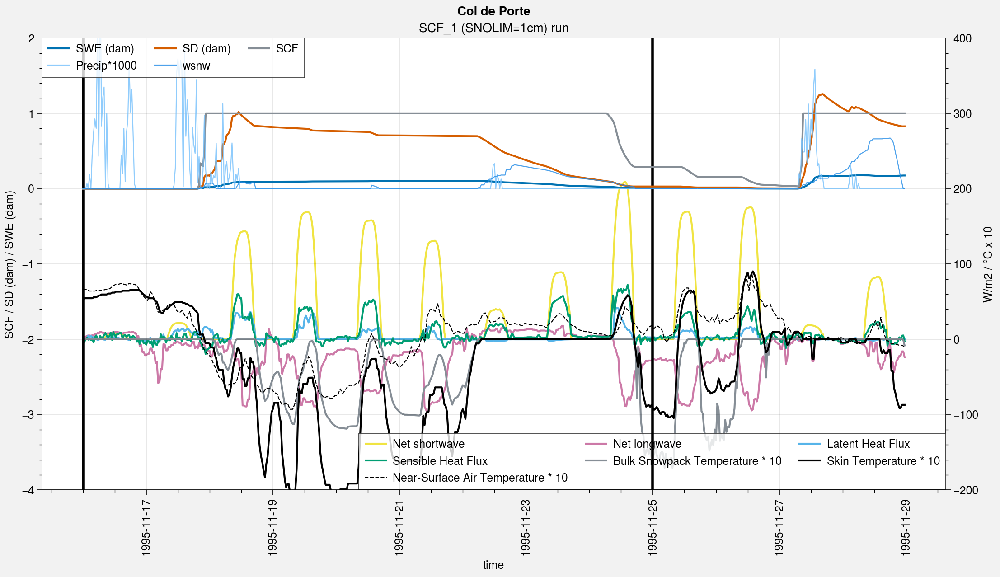

In [57]:
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

axs[0].plot(ds2_hh.snw.sel(time=period3)*1e-3*10, label='SWE (dam)')
axs[0].plot(ds2_hh.snd.sel(time=period3)*10, label='SD (dam)')
axs[0].plot(ds2_hh.snc.sel(time=period3), label='SCF', color='gray6')
axs[0].plot(ds2_hh.pr.sel(time=period3)*1e3, label='Precip*1000', color='blue3', alpha=0.8, lw=0.8)
axs[0].plot(ds2_hh.wsnw.sel(time=period3), label='wsnw', color='blue6', alpha=0.8, lw=0.8)

ox = axs[0].alty(label='W/m2 / °C x 10')
ox.plot(ds2_hh.rss.sel(time=period3), label='Net shortwave', color='C4')
ox.plot(ds2_hh.rls.sel(time=period3), label='Net longwave', color='C3')
ox.plot(ds2_hh.hfls.sel(time=period3), label='Latent Heat Flux', color='C5')
ox.plot(ds2_hh.hfss.sel(time=period3), label='Sensible Heat Flux', color='C2')
ox.plot((ds2_hh.tsn.sel(time=period3))*10, label='Bulk Snowpack Temperature * 10', color='gray6')
ox.plot((ds2_hh.ts.sel(time=period3)-273.15)*10, label='Skin Temperature * 10', color='k')
ox.plot((ds2_hh.tas.sel(time=period3)-273.15)*10, label='Near-Surface Air Temperature * 10', color='k', ls='--', lw=0.8)

ox.legend(loc='lr')
axs[0].legend(loc='ul')
axs[0].format(title='SCF_1 (SNOLIM=1cm) run', ylabel='SCF / SD (dam) / SWE (dam)')
ox.format(ylim=(-200, 400))
axs[0].format(ylim=(-4, 2))

period4 = slice('1995-11-16','1995-11-25')
axs[0].vlines(ds_d.sel(time=period4).time[0], -4, 3, color='k', lw=2)
axs[0].vlines(ds_d.sel(time=period4).time[-1], -4, 3, color='k', lw=2)

fig.suptitle('Col de Porte')

In [13]:
path_SnowMIP_eval = '/home/lalandmi/Dropbox/data/SnowMIP/evaluation/FR-Cdp/Morin_2012/datasets'
df = pd.read_csv(path_SnowMIP_eval+'/CDP_daily_eval.tab', skiprows=23, delimiter='\t', infer_datetime_format=True, index_col=0)
df.index = pd.to_datetime(df.index)

In [65]:
10*30

300

Text(0.5, 0.98, 'Col de Porte')

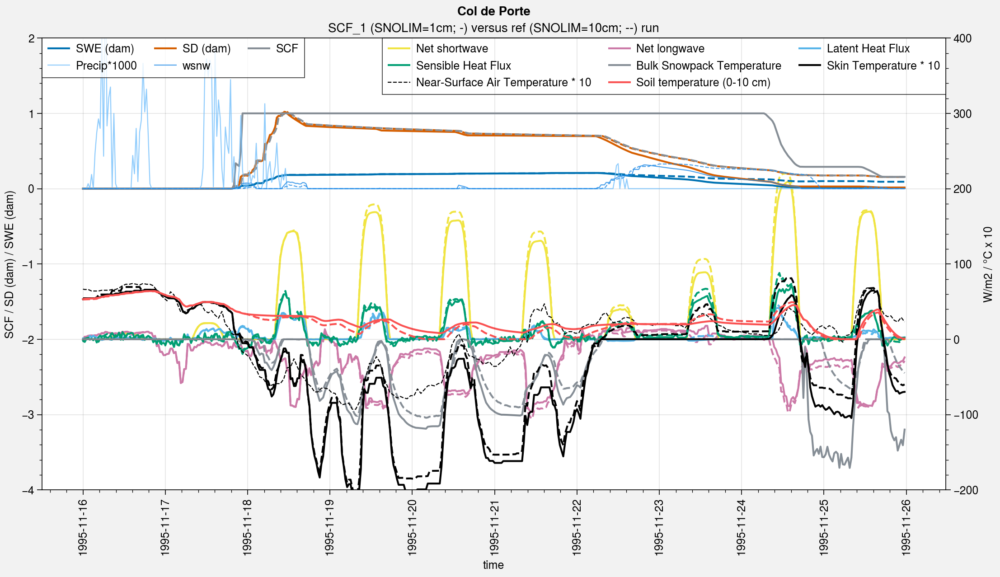

In [59]:
# %matplotlib inline
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

i_start = '1995-11-16'
i_end = '1995-11-25'

h0 = axs[0].plot(ds2_hh.snw.sel(time=period4)*1e-3*20, label='SWE (dam)', color='C0')
axs[0].plot(ds_hh.snw.sel(time=period4)*1e-3*20, label='SWE (dam)', color='C0', ls='--')
h1 = axs[0].plot(ds2_hh.snd.sel(time=period4)*10, label='SD (dam)', color='C1')
axs[0].plot(ds_hh.snd.sel(time=period4)*10, label='SD (dam)', color='C1', ls='--')
h2 = axs[0].plot(ds2_hh.snc.sel(time=period4), label='SCF', color='gray6')
axs[0].plot(ds_hh.snc.sel(time=period4), label='SCF', color='gray6', ls='--')
h3 = axs[0].plot(ds_hh.pr.sel(time=period4)*1e3, label='Precip*1000', color='blue3', alpha=0.8, lw=0.8)
h4 = axs[0].plot(ds2_hh.wsnw.sel(time=period4), label='wsnw', color='blue6', alpha=0.8, lw=0.8)
axs[0].plot(ds_hh.wsnw.sel(time=period4), label='wsnw', color='blue6', alpha=0.8, lw=0.8, ls='--')


ox = axs[0].alty(label='W/m2 / °C x 10')
h5 = ox.plot(ds2_hh.rss.sel(time=period4), label='Net shortwave', color='C4')
ox.plot(ds_hh.rss.sel(time=period4), label='Net shortwave', color='C4', ls='--')
h6 = ox.plot(ds2_hh.rls.sel(time=period4), label='Net longwave', color='C3')
ox.plot(ds_hh.rls.sel(time=period4), label='Net longwave', color='C3', ls='--')
h7 = ox.plot(ds2_hh.hfls.sel(time=period4), label='Latent Heat Flux', color='C5')
ox.plot(ds_hh.hfls.sel(time=period4), label='Latent Heat Flux', color='C5', ls='--')
h8 = ox.plot(ds2_hh.hfss.sel(time=period4), label='Sensible Heat Flux', color='C2')
ox.plot(ds_hh.hfss.sel(time=period4), label='Sensible Heat Flux', color='C2', ls='--')
h9 = ox.plot(ds2_hh.tsn.sel(time=period4)*10, label='Bulk Snowpack Temperature', color='gray6')
ox.plot(ds_hh.tsn.sel(time=period4)*10, label='Bulk Snowpack Temperature', color='gray6', ls='--')
h10 = ox.plot((ds2_hh.ts.sel(time=period4)-273.15)*10, label='Skin Temperature * 10', color='k')
ox.plot((ds_hh.ts.sel(time=period4)-273.15)*10, label='Skin Temperature * 10', color='k', ls='--')

h11 = ox.plot((ds_hh.tas.sel(time=period4)-273.15)*10, label='Near-Surface Air Temperature * 10', color='k', ls='--', lw=0.8)

h12 = ox.plot((ds2_hh.tsl.sel(layer=1, time=period4)-273.15)*10, label='Soil temperature (0-10 cm)', color='red6')
ox.plot((ds_hh.tsl.sel(layer=1, time=period4)-273.15)*10, label='Soil temperature (0-10 cm)', color='red6', ls='--')


ox.legend([h5, h6, h7, h8, h9, h10, h11, h12], loc='ur')
axs[0].legend([h0, h1, h2, h3, h4], loc='ul')
axs[0].format(title='SCF_1 (SNOLIM=1cm; -) versus ref (SNOLIM=10cm; --) run', ylabel='SCF / SD (dam) / SWE (dam)')
ox.format(ylim=(-200, 400))
axs[0].format(ylim=(-4, 2))

fig.suptitle('Col de Porte')


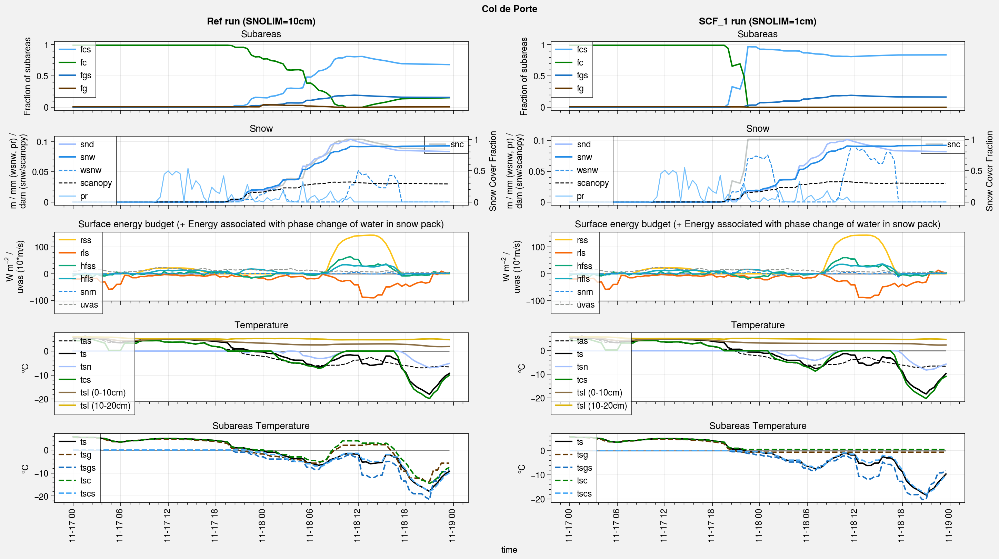

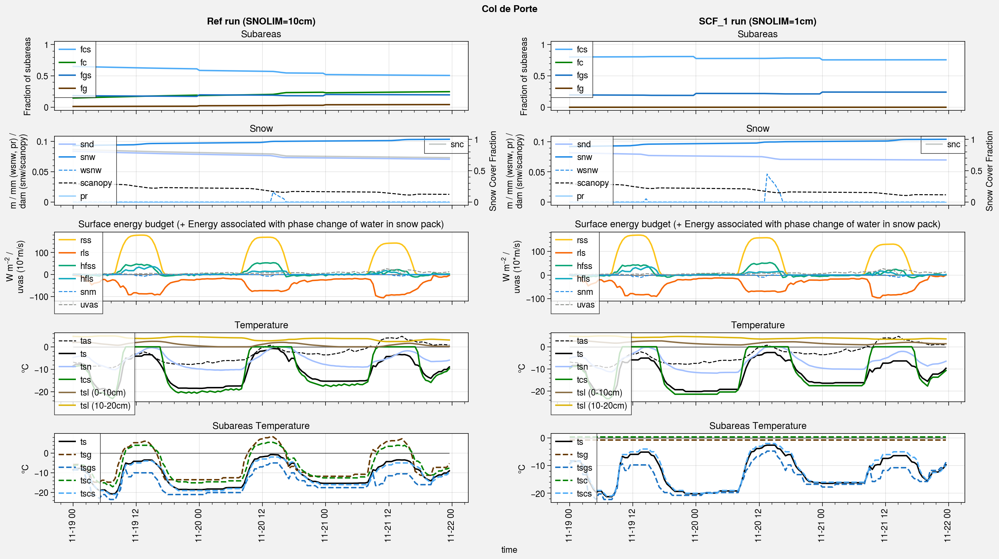

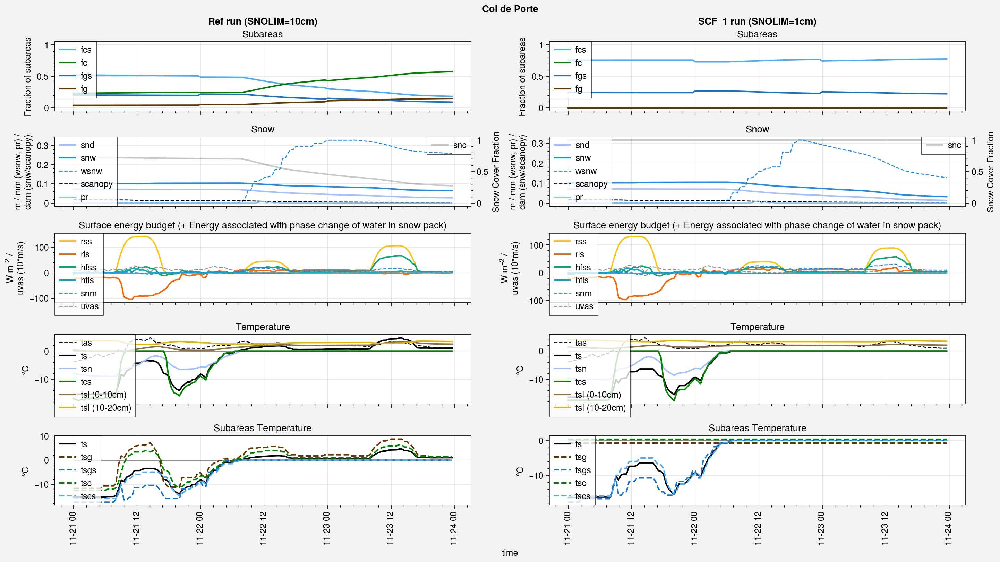

In [153]:
for period in [
    slice('1995-11-17','1995-11-18'),
    slice('1995-11-19','1995-11-21'),
    slice('1995-11-21','1995-11-23')
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
    #     ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


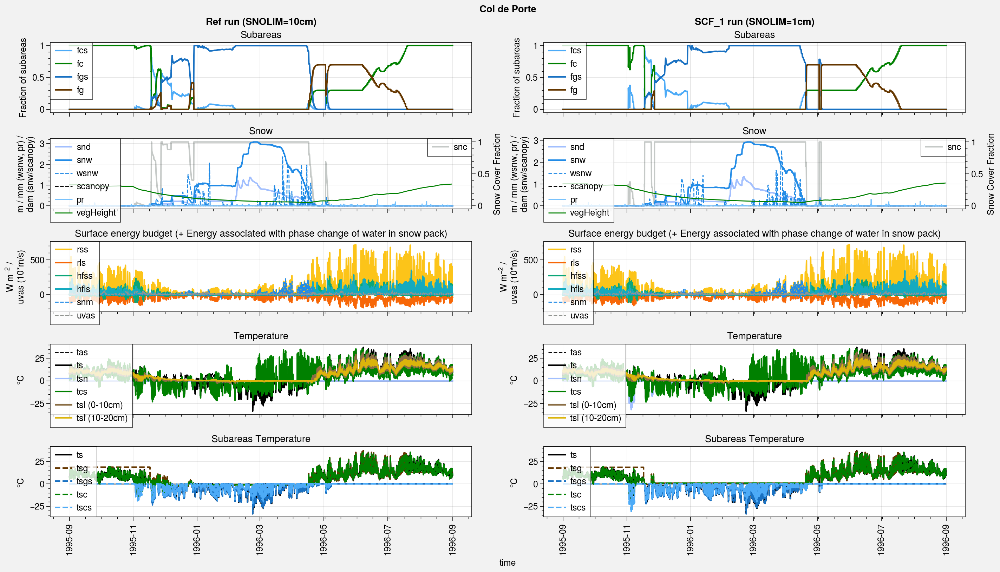

In [163]:
for period in [
    slice('1995-09','1996-08'),
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


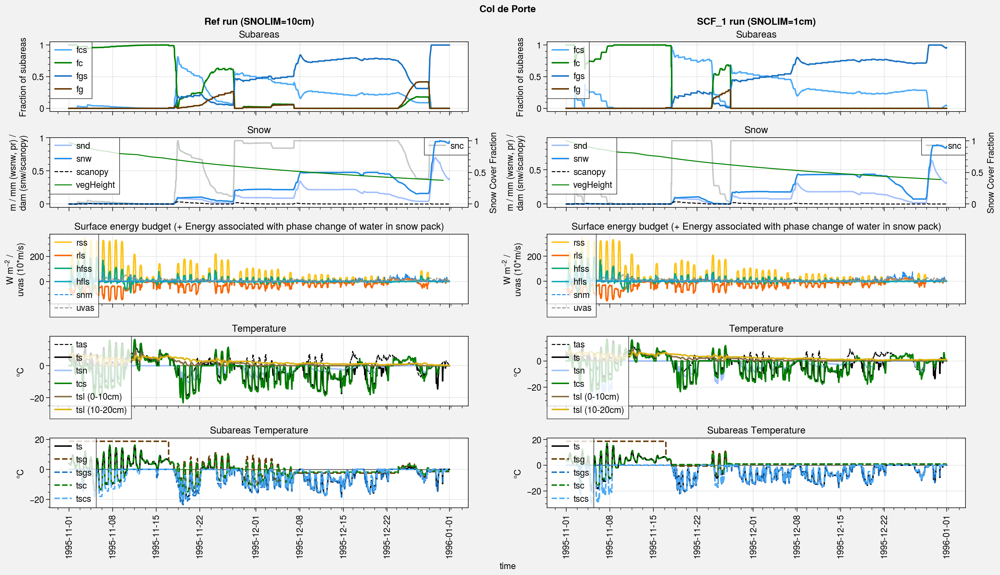

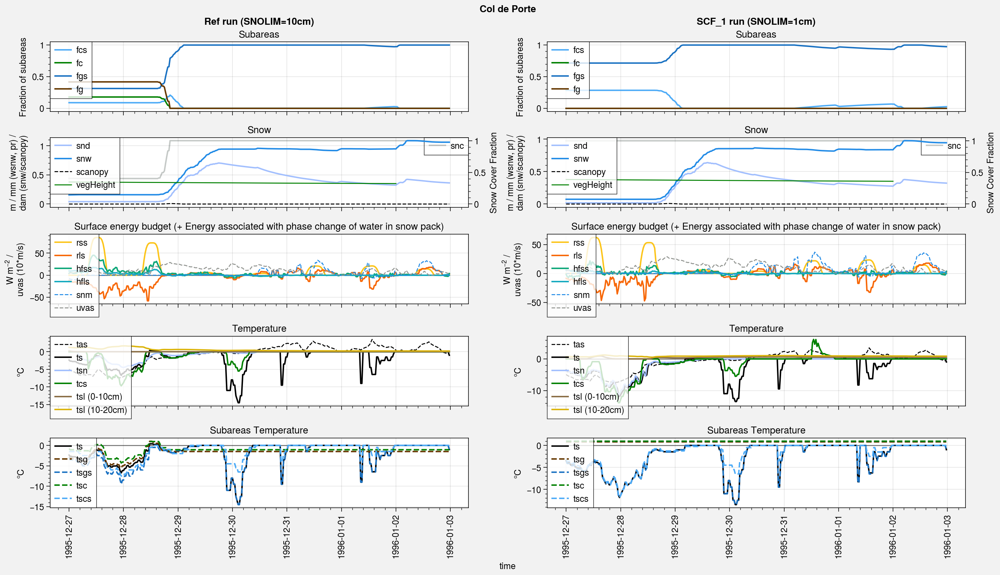

In [172]:
for period in [
    slice('1995-11','1995-12'),
    slice('1995-12-27','1996-01-02'),
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
#             'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
#             'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


## Half hourly outputs 1999

Zoom on the begining of the snow season

Text(0.5, 0.98, 'Col de Porte')

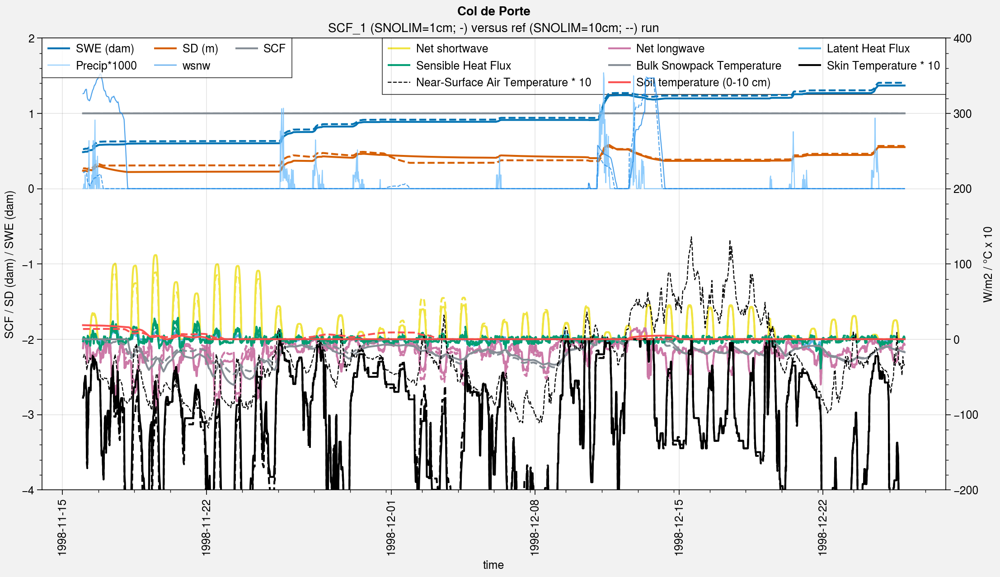

In [179]:
# %matplotlib inline
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

period4 = slice('1998-11-16','1998-12-25')

h0 = axs[0].plot(ds2_hh.snw.sel(time=period4)*1e-3*10, label='SWE (dam)', color='C0')
axs[0].plot(ds_hh.snw.sel(time=period4)*1e-3*10, label='SWE (dam)', color='C0', ls='--')
h1 = axs[0].plot(ds2_hh.snd.sel(time=period4), label='SD (m)', color='C1')
axs[0].plot(ds_hh.snd.sel(time=period4), label='SD (m)', color='C1', ls='--')
h2 = axs[0].plot(ds2_hh.snc.sel(time=period4), label='SCF', color='gray6')
axs[0].plot(ds_hh.snc.sel(time=period4), label='SCF', color='gray6', ls='--')
h3 = axs[0].plot(ds_hh.pr.sel(time=period4)*1e3, label='Precip*1000', color='blue3', alpha=0.8, lw=0.8)
h4 = axs[0].plot(ds2_hh.wsnw.sel(time=period4), label='wsnw', color='blue6', alpha=0.8, lw=0.8)
axs[0].plot(ds_hh.wsnw.sel(time=period4), label='wsnw', color='blue6', alpha=0.8, lw=0.8, ls='--')


ox = axs[0].alty(label='W/m2 / °C x 10')
h5 = ox.plot(ds2_hh.rss.sel(time=period4), label='Net shortwave', color='C4')
ox.plot(ds_hh.rss.sel(time=period4), label='Net shortwave', color='C4', ls='--')
h6 = ox.plot(ds2_hh.rls.sel(time=period4), label='Net longwave', color='C3')
ox.plot(ds_hh.rls.sel(time=period4), label='Net longwave', color='C3', ls='--')
h7 = ox.plot(ds2_hh.hfls.sel(time=period4), label='Latent Heat Flux', color='C5')
ox.plot(ds_hh.hfls.sel(time=period4), label='Latent Heat Flux', color='C5', ls='--')
h8 = ox.plot(ds2_hh.hfss.sel(time=period4), label='Sensible Heat Flux', color='C2')
ox.plot(ds_hh.hfss.sel(time=period4), label='Sensible Heat Flux', color='C2', ls='--')
h9 = ox.plot(ds2_hh.tsn.sel(time=period4)*10, label='Bulk Snowpack Temperature', color='gray6')
ox.plot(ds_hh.tsn.sel(time=period4)*10, label='Bulk Snowpack Temperature', color='gray6', ls='--')
h10 = ox.plot((ds2_hh.ts.sel(time=period4)-273.15)*10, label='Skin Temperature * 10', color='k')
ox.plot((ds_hh.ts.sel(time=period4)-273.15)*10, label='Skin Temperature * 10', color='k', ls='--')

h11 = ox.plot((ds_hh.tas.sel(time=period4)-273.15)*10, label='Near-Surface Air Temperature * 10', color='k', ls='--', lw=0.8)

h12 = ox.plot((ds2_hh.tsl.sel(layer=1, time=period4)-273.15)*10, label='Soil temperature (0-10 cm)', color='red6')
ox.plot((ds_hh.tsl.sel(layer=1, time=period4)-273.15)*10, label='Soil temperature (0-10 cm)', color='red6', ls='--')


ox.legend([h5, h6, h7, h8, h9, h10, h11, h12], loc='ur')
axs[0].legend([h0, h1, h2, h3, h4], loc='ul')
axs[0].format(title='SCF_1 (SNOLIM=1cm; -) versus ref (SNOLIM=10cm; --) run', ylabel='SCF / SD (dam) / SWE (dam)')
ox.format(ylim=(-200, 400))
axs[0].format(ylim=(-4, 2))

fig.suptitle('Col de Porte')


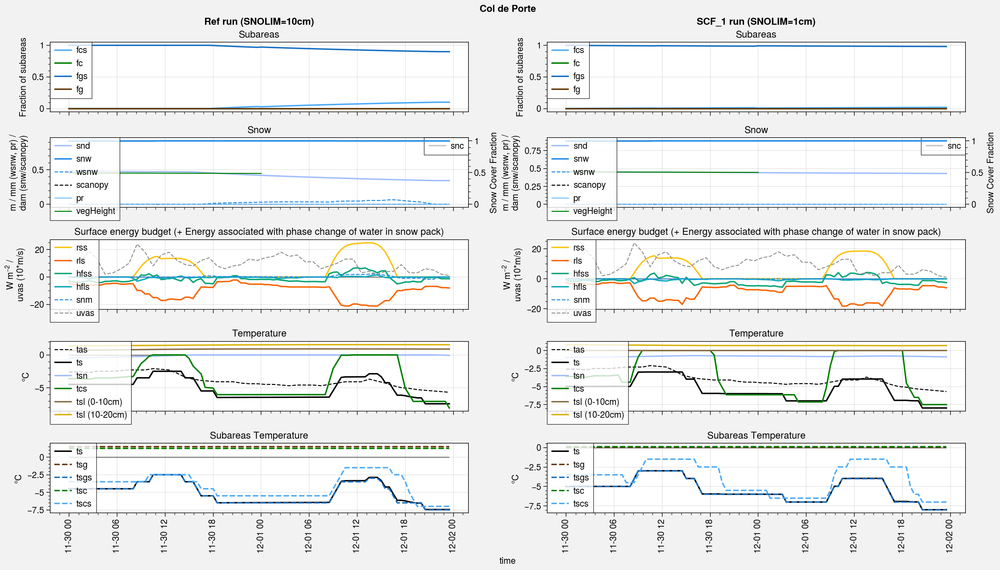

In [183]:
for period in [
    slice('1998-11-30','1998-12-01'),
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


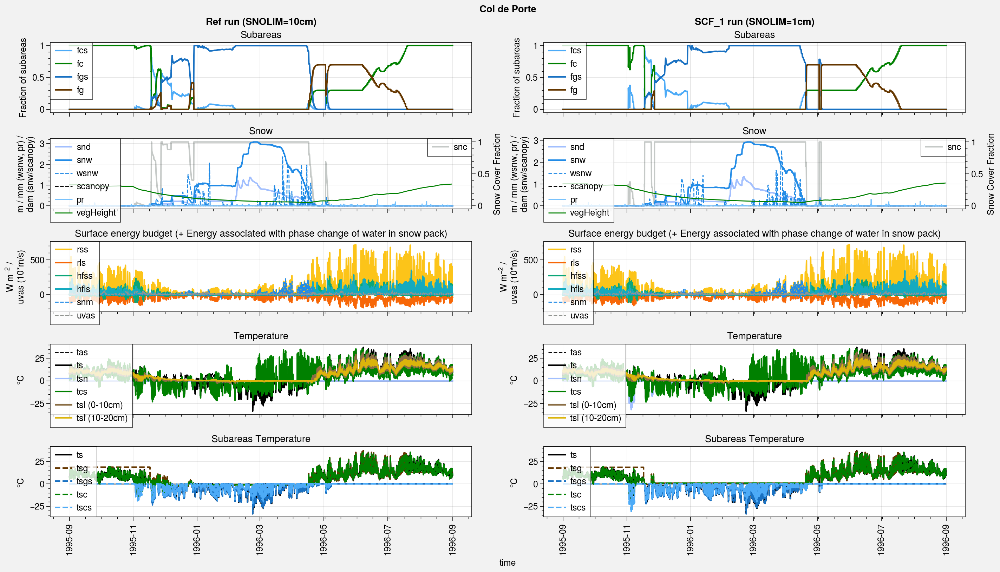

In [163]:
for period in [
    slice('1995-09','1996-08'),
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
            'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
            'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


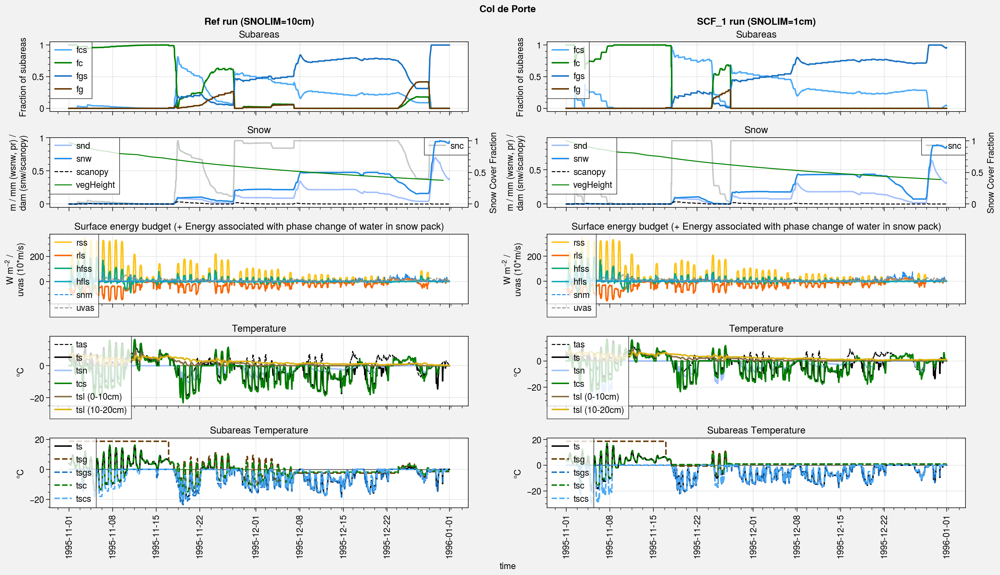

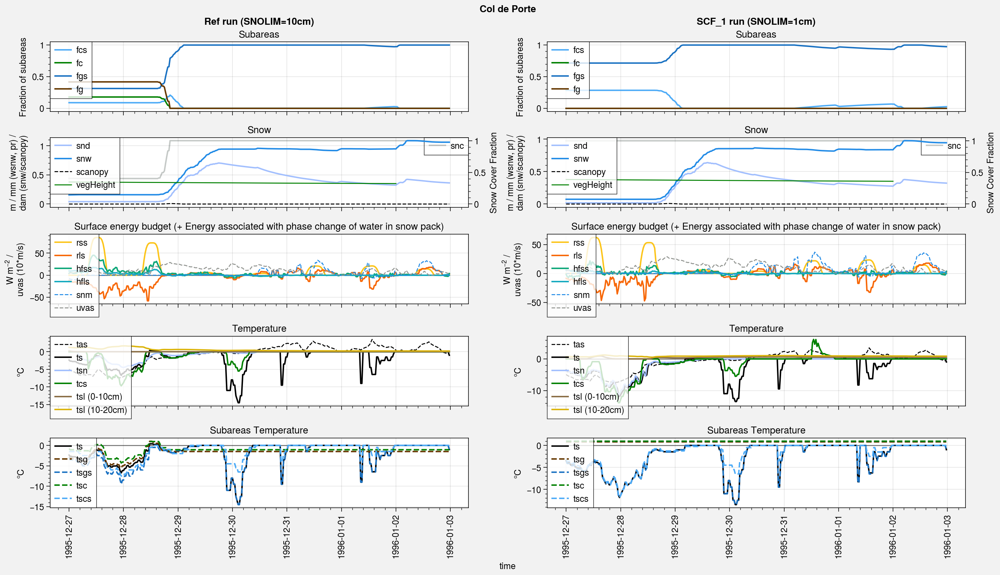

In [172]:
for period in [
    slice('1995-11','1995-12'),
    slice('1995-12-27','1996-01-02'),
]:

    fig, axs = plot.subplots(ncols=2, nrows=5, aspect=6, axwidth=6, sharey=0)

    for i, ds in enumerate([ds_hh, ds2_hh]):

        #############################
        ### Fractions of subareas ###
        #############################

        variables = {
            'fcs': {'color': 'blue4', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fc': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fgs': {'color': 'blue8', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'fg': {'color': 'brown', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[0+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='Fraction of subareas', title='Subareas', ylim=(-0.05,1.05))

        ##############################
        ### Snow related variables ###
        ##############################

        variables = {
            'snc': {'color': 'silver', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snd': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snw': {'color': 'blue6', 'ls': '-', 'lw': 1.5, 'factor': 1e-3*10, 'shift': 0},
#             'wsnw': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'scanopy': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1e-3*10, 'shift': 0},
#             'pr': {'color': 'blue3', 'ls': '-', 'lw': 1, 'factor': 30, 'shift': 0},
        #     'albs': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
    #         'mrron': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        #     'snm': {'color': 'blue8', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
        }

        ax = axs[2+i]
        for key in list(variables.keys())[1:]:
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot(ds_d.vegHeight.sel(time=period), label=ds_d.vegHeight.name, color='green', ls='-', lw=1)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='m / mm (wsnw, pr) /\ndam (snw/scanopy)', title='Snow')
        ox = ax.alty(label='Snow Cover Fraction')
        for key in list(variables.keys())[0:1]:
            ox.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ox.legend(ncols=1, loc='ur')
        ox.format(ylim=(-0.05,1.05))


        ##############################
        ### Surface energy budget ###
        ##############################

        variables = {
            'rss': {'color': 'yellow5', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'rls': {'color': 'orange7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        #     'rlds': {'color': 'orange7', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'hfss': {'color': 'teal7', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'hfls': {'color': 'cyan6', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'snm': {'color': 'blue6', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 0},
            'uvas': {'color': 'gray', 'ls': '--', 'lw': 1, 'factor': 10, 'shift': 0},
        }

        ax = axs[4+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='W m$^{-2}$ /\nuvas (10*m/s)', title='Surface energy budget (+ Energy associated with phase change of water in snow pack)')


        ###################
        ### Temperature ###
        ###################

        variables = {
            'tas': {'color': 'k', 'ls': '--', 'lw': 1, 'factor': 1, 'shift': 273.15},
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},    
            'tsn': {'color': 'pastel blue', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
            'tcs': {'color': 'green', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 0},
        }

        ax = axs[6+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.plot((ds.tsl-273.15).sel(layer=1, time=period), label=ds.tsl.name+' (0-10cm)', color='dirt')
        ax.plot((ds.tsl-273.15).sel(layer=2, time=period), label=ds.tsl.name+' (10-20cm)', color='gold')
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Temperature')


        ############################
        ### Subareas Temperature ###
        ############################

        variables = {
            'ts': {'color': 'k', 'ls': '-', 'lw': 1.5, 'factor': 1, 'shift': 273.15},

            'tsg': {'color': 'brown', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsgs': {'color': 'blue8', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tsc': {'color': 'green', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
            'tscs': {'color': 'blue4', 'ls': '--', 'lw': 1.5, 'factor': 1, 'shift': 273.15},
        }

        ax = axs[8+i]
        for key in variables.keys():
            ax.plot(((ds[key]-variables[key]['shift'])*variables[key]['factor']).sel(time=period), label=ds[key].name, 
                    color=variables[key]['color'], ls=variables[key]['ls'], lw=variables[key]['lw'])
        ax.hlines(0, ds.sel(time=period).time[0], ds.sel(time=period).time[-1], color='k', lw=1, alpha=0.5)
        ax.legend(ncols=1, loc='ul')
        ax.format(ylabel='°C', title='Subareas Temperature')

    fig.suptitle('Col de Porte')
    axs.format(collabels=['Ref run (SNOLIM=10cm)', 'SCF_1 run (SNOLIM=1cm)'])


In [200]:
path_morin2012 = '/home/lalandmi/Dropbox/data/SnowMIP/evaluation/FR-Cdp/Morin_2012/datasets'
path_menard2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
path_lejeune2019 = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/CRYOBSCLIM_CDP'

df_h_obs = pd.read_csv(path_morin2012+'/CDP_hor_eval.tab', skiprows=20, delimiter='\t', infer_datetime_format=True, index_col=0)
df_h_obs.index = pd.to_datetime(df_h_obs.index)
ds_h_obs = df_h_obs.to_xarray()
ds_h_obs = ds_h_obs.rename({'Date/Time': 'time'})

df_d_obs = pd.read_csv(path_morin2012+'/CDP_daily_eval.tab', skiprows=23, delimiter='\t', infer_datetime_format=True, index_col=0)
df_d_obs.index = pd.to_datetime(df_d.index)
ds_d_obs = df_d_obs.to_xarray()
ds_d_obs = ds_d_obs.rename({'Date/Time': 'time'})

Text(0.5, 0.98, 'Col de Porte')

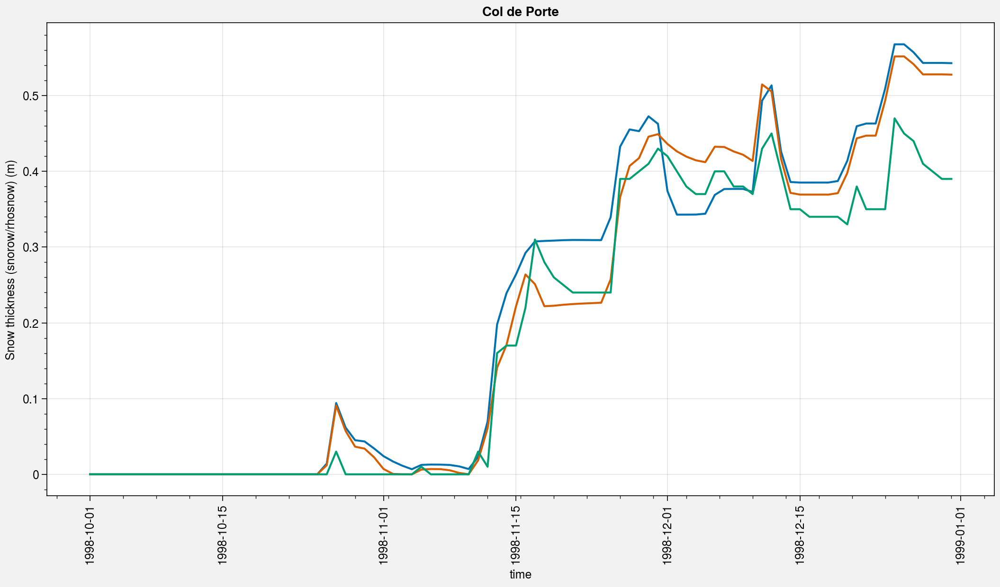

In [209]:
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=2, axwidth=10)

period=slice('1998-10','1998-12')

axs[0].plot(ds_d.snd.sel(time=period), label='SD (m)')
# axs[0].plot(ds_hh.snd.sel(time=period), label='SD (m)')
axs[0].plot(ds2_d.snd.sel(time=period), label='SD (m)')
# axs[0].plot(ds2_hh.snd.sel(time=period), label='SD (m)')
# axs[0].plot(ds_h_obs['Snow thick [m] (automated measurement, Ultra-...)'].sel(time=period))
axs[0].plot(ds_d_obs['Snow thick [m] (automated measurement, Ultra-...)'].sel(time=period))

fig.suptitle('Col de Porte')


Text(0.5, 0.98, 'Run Col de Porte (1995-2013)')

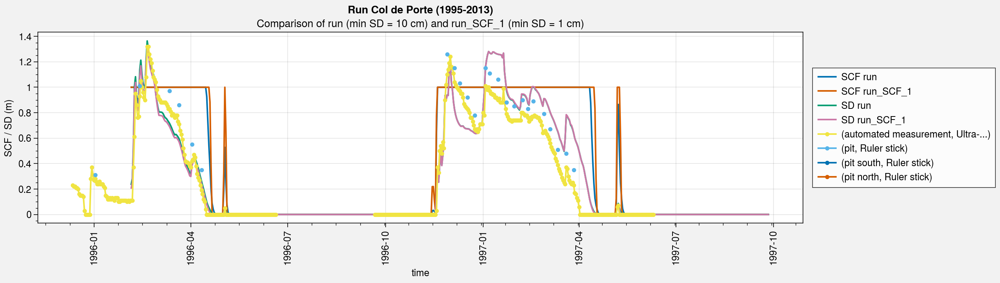

In [19]:
fig, axs = plot.subplots(ncols=1, nrows=1, aspect=4, axwidth=10)

i_start = 400
i_end = 1000

axs[0].plot(ds_d.snc[i_start:i_end], label='SCF '+label)
axs[0].plot(ds2_d.snc[i_start:i_end], label='SCF '+label2)
axs[0].plot(ds_d.snd[i_start:i_end], label='SD '+label)
axs[0].plot(ds2_d.snd[i_start:i_end], label='SD '+label2)
axs[0].plot(df.iloc[i_start+360:i_end+360, 0:4], marker='.', labels=[col[15:] for col in df.columns[0:4]])

fig.legend(ncols=1)
axs[0].format(
    title='Comparison of run (min SD = 10 cm) and run_SCF_1 (min SD = 1 cm)',
    ylabel='SCF / SD (m)'
)
fig.suptitle('Run Col de Porte (1995-2013)')